# Exploration of hormonal receptor genes in He et al. organoid atlas dataset - HNOCA extended dataset - Metacell calculation by SeaCells

[Reference paper](https://www.nature.com/articles/s41586-024-08172-8)

These are the filterings done on the adata available in cellxgene. Done in 1.notebook SubsetHNOCA.ipynb 

- authors_keep = [
    "Esk, 2020",
    "Pellegrini, 2020",
    "Velasco, 2019",
    "Pasca, 2015",
    "Trujillo, 2019",
    "Yoon, 2019",
    "Qian, 2020",
    "Bhaduri, 2020",
    "Birey, 2017"
]; 
mask_author = adata_complete.obs["assay_differentiation"].str.contains("|".join(authors_keep), na=False)
- mask_age = adata_complete.obs["organoid_age_days"] <= 50

__This Notebook__

Metacell calculation by SEACells (following [this tutorial](https://github.com/dpeerlab/SEACells/blob/main/notebooks/SEACell_computation.ipynb))


-----

# 1. Environment

## 1.1 Modules

In [1]:
import os
import sys

import numpy as np
import pandas as pd
import scanpy as sc

import pickle

#Plotting
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

#utils
#import ipynbname
from datetime import datetime

# SeaCell
import SEACells

#import custom functions
sys.path.append('../')
import functions as fn

In [2]:
# Some plotting aesthetics
%matplotlib inline

sns.set_style('ticks')
matplotlib.rcParams['figure.figsize'] = [3.5, 3.5]
matplotlib.rcParams['figure.dpi'] = 100

In [3]:
print("Scanpy version: ", sc.__version__)
print("Pandas version: ", pd.__version__)
print("SEACell version: ", SEACells.__version__)

Scanpy version:  1.10.2
Pandas version:  2.2.2
SEACell version:  0.3.3


## 1.2 Settings


In [4]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

## 1.3 Files and parameters

In [18]:
input_file = '../../../../DataDir/ExternalData/SingleCellData/HNOCA_adata_downsampledForMetacells.h5ad'
output_file = '../../../../DataDir/ExternalData/SingleCellData/HNOCA_protocol_age_Metacells_harmony.h5ad'

## 1.4 Start computations

In [6]:
print(datetime.now())

2026-04-16 13:38:40.577258


----

# 2. Data Load


## 2.1 Read adata file

* SEACells uses as input filtered unnormalized counts from scRNASeq data, that are subjected to normalization and log-transformation before metacell assignment
* Here we start from data that has already undergone the steps of QC, filtering, normalization, log transformation
* The sum of expression levels from cells to metacells will occur at the count level  

In [7]:
adata = sc.read(input_file)

In [8]:
adata

AnnData object with n_obs × n_vars = 37011 × 35725
    obs: 'assay_differentiation', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_type_original', 'gm', 'id', 'individual', 'state_exact', 'suspension_type', 'tech_sample', 'treatment', 'organoid_age_days', 'publication', 'doi', 'batch', 'annot_level_1', 'annot_level_2', 'annot_level_3_rev2', 'annot_level_4_rev2', 'annot_region_rev2', 'annot_ntt_rev2', 'Hallmark_Glycolysis', 'hnoca_core', 'annot_level_2_extended', 'tissue_type', 'sex_ontology_term_id', 'donor_id', 'assay_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'disease_ontology_term_id', 'development_stage_ontology_term_id', 'cell_type_ontology_term_id', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'age_group'
    var: 'gene_length', 'highly_variable', 'highly_variable_rank', 'highly_variable_nbatches', 'feature_is_filtered', 'fe

In [9]:
adata.obsm

AxisArrays with keys: X_draw_graph_fa_harmony, X_draw_graph_fa_nocorr, X_pca, X_pca_harmony, X_scpoli, X_umap_harmony, X_umap_nocorr, X_umap_scpoli

In [10]:
adata.X

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 77942350 stored elements and shape (37011, 35725)>

In [11]:
print(adata.X[40:45, 40:45])

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 1 stored elements and shape (5, 5)>
  Coords	Values
  (3, 4)	1.0616281032562256


In [12]:
adata.obs['assay_differentiation'].value_counts()

assay_differentiation
Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)                   12395
Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hChPO            9637
Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); most directed     6705
Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed          2758
Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO              2758
Trujillo, 2019 (doi: 10.1016/j.stem.2019.08.002)                  2758
Name: count, dtype: int64

In [13]:
adata.obs['age_group'].value_counts()

age_group
30-40    13790
<30      11841
40-50    11380
Name: count, dtype: int64

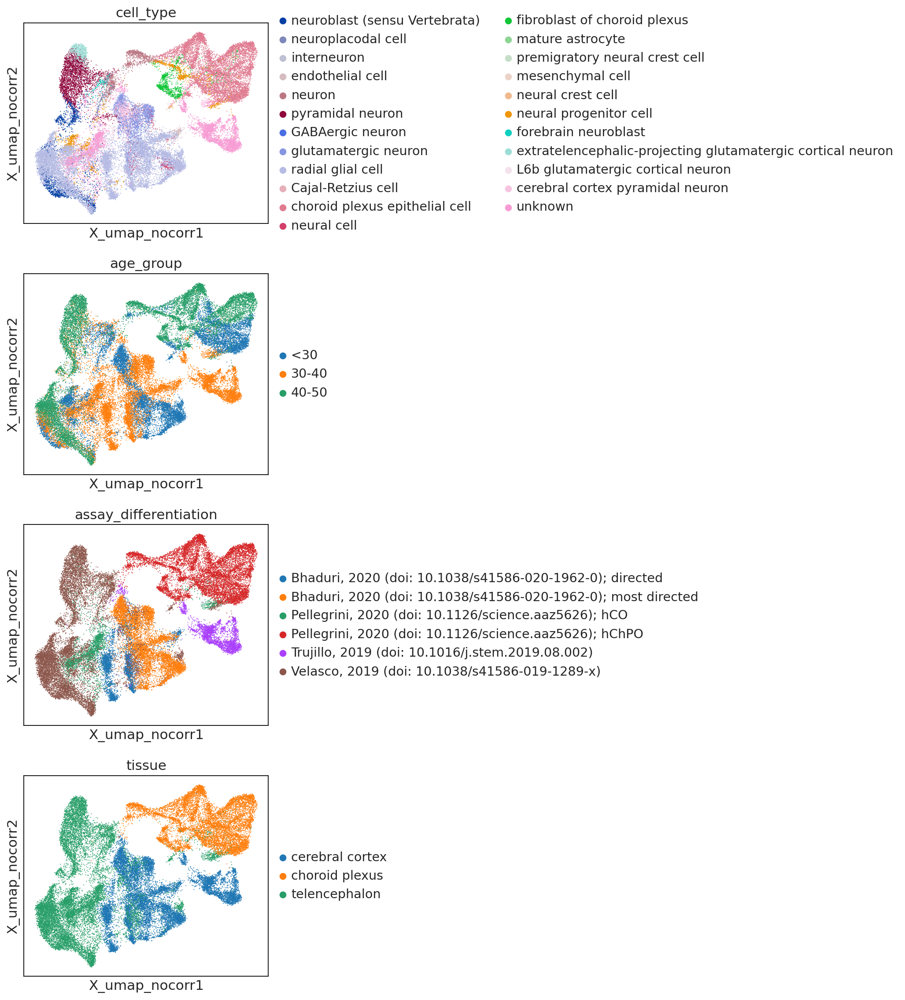

In [14]:
sc.pl.embedding(adata,  basis="X_umap_nocorr", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1)

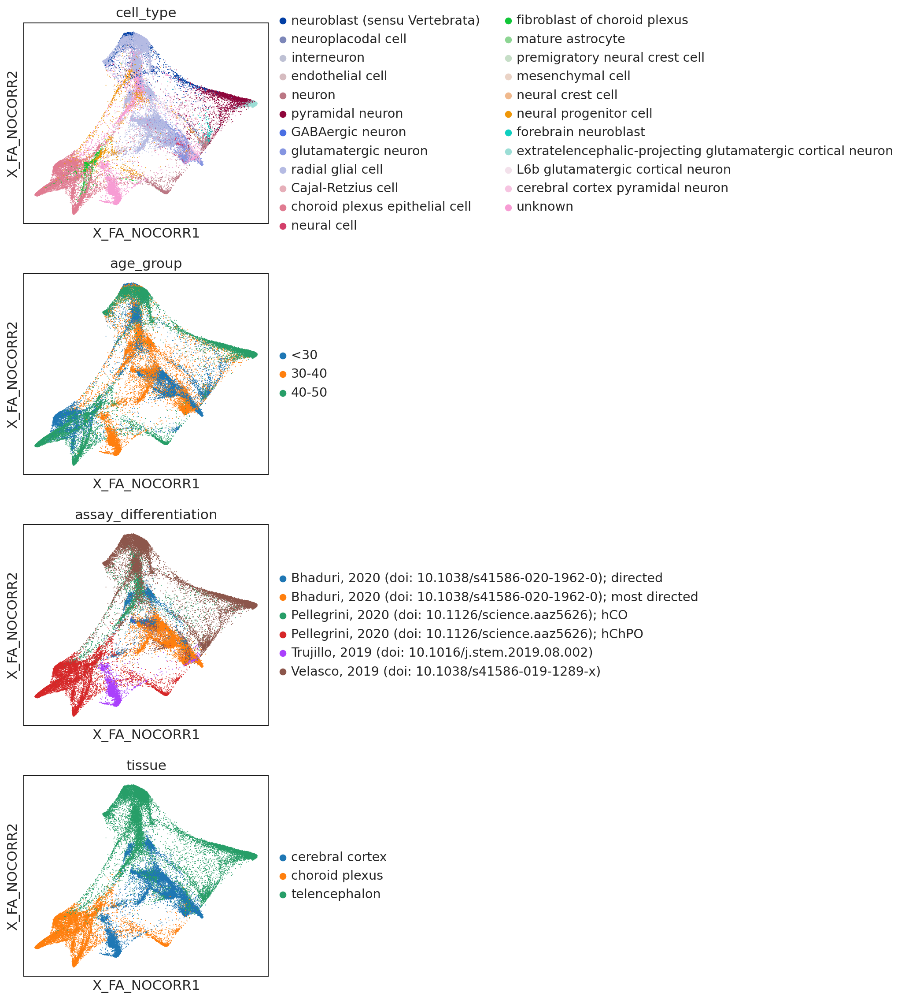

In [15]:
sc.pl.embedding(adata,  basis="X_draw_graph_fa_nocorr", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1)

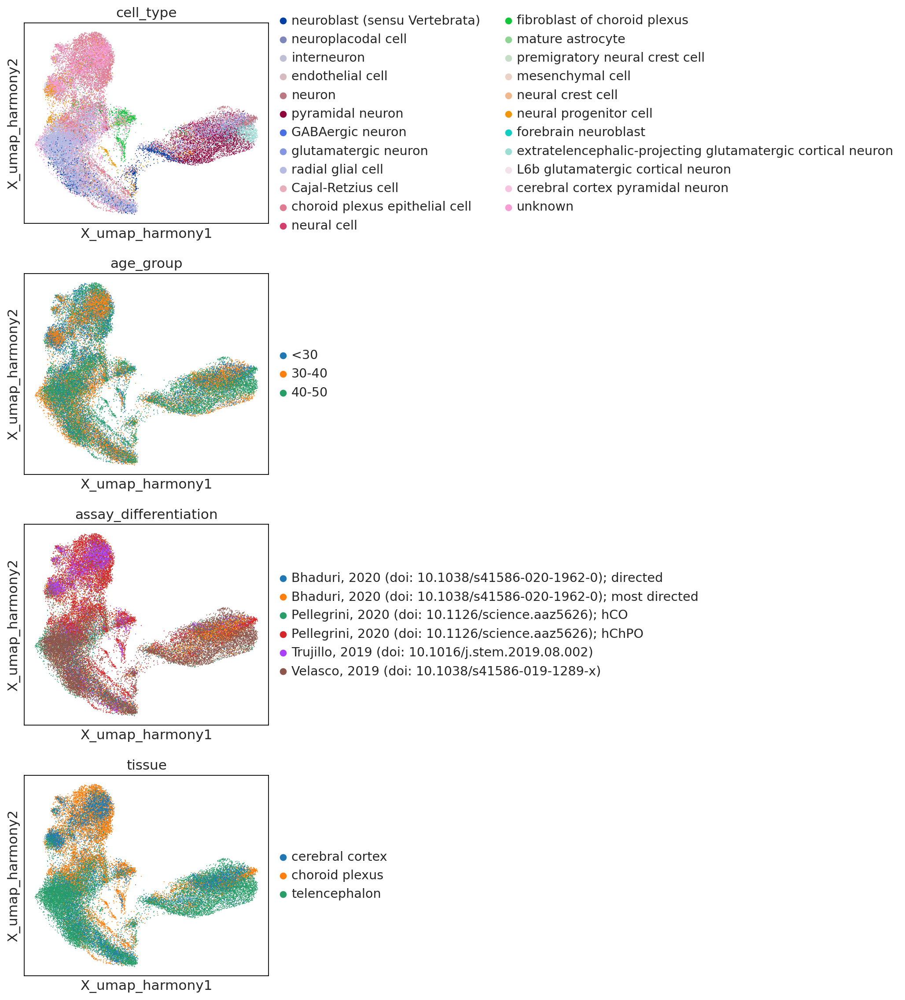

In [16]:
sc.pl.embedding(adata,  basis="X_umap_harmony", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1)

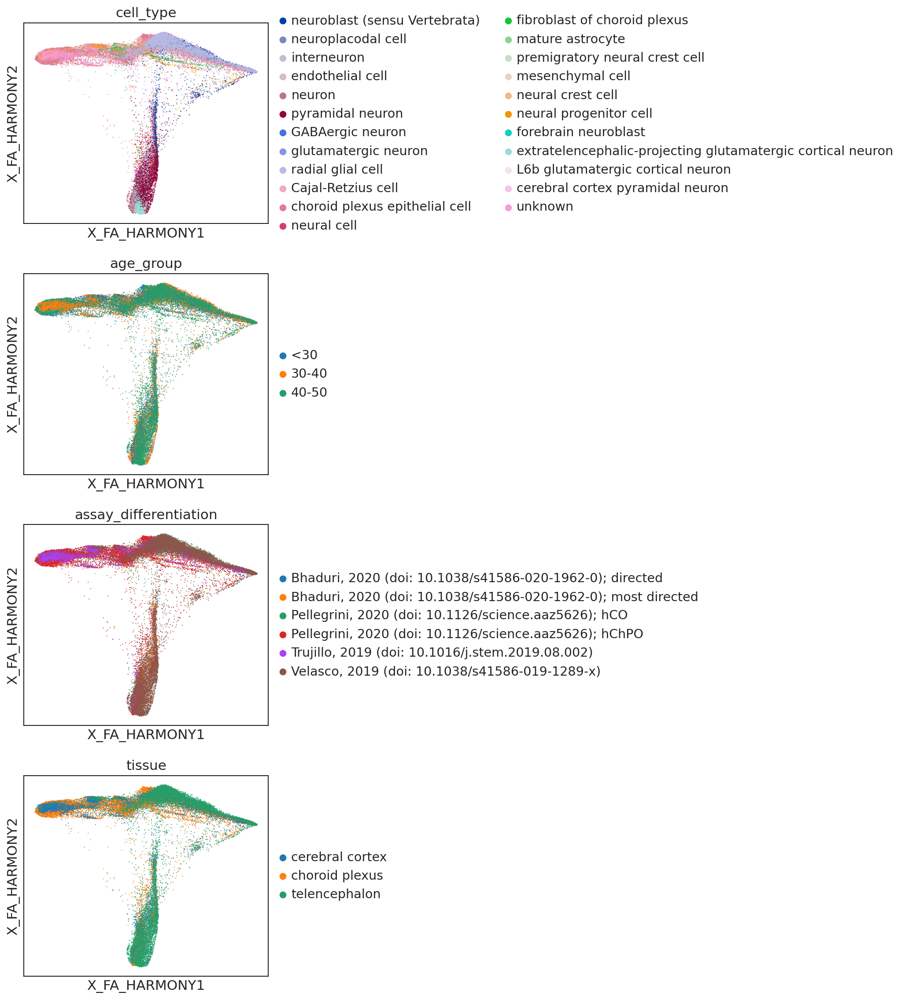

In [114]:
outdir = "../../../../FigPaper/"

os.makedirs(outdir, exist_ok=True)

sc.settings.figdir = outdir
sc.pl.embedding(adata,  basis="X_draw_graph_fa_harmony", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1, save="HNCOA_drawgraph.png")

## 2.2 Pre-processing

Normalization, log-transformation, HVG and dimensionality reduction already performed.

# 3. Run SEACells

We follow the workflow described in the [SEACells tutorial](https://github.com/dpeerlab/SEACells/blob/main/notebooks/SEACell_computation.ipynb)



Parameters to be defined: 

* __Number of metacells__ (graining level): choosing one metacell for every 75 single-cells. __Let's do it splitting by age_group!__
* __X_pca_harmony__ as the key in .obsm for computing in metacells. PCs already corrected by harmony.
* __Number of eigenvalues__ for metacell initialization

We then employ the __SEACells.core.SEACells__ function to initialize the model. 

_Note_: Running SEACells modifies the input Anndata object and adds the SEACell metacell assignments to the obs dataframe in the anndata object.

[__construct_kernel_matrix__](https://github.com/dpeerlab/SEACells/blob/main/SEACells/cpu.py) function constructs the kernel matrix from data matrix using PCA/SVD and nearest neighbors. Key parameters are: 

* n_neighbors: (int) number of nearest neighbors to use for graph construction (default 15). Increasing this number results in a more homogeneous distribution of metacell size, but may impact on the preservation of rare cell types. Usually stable performance in the range 5-30. 
* graph_construction: method for graph construction.

* [__initialize_archetypes__](https://github.com/dpeerlab/SEACells/blob/main/SEACells/cpu.py) function initializes the B matrix which defines cells as SEACells.
* The function uses waypoint analysis for initialization into to fully cover the phenotype space, and then greedily selects the remaining cells.

<30: 11841 cells → 158 metacells (~75 cells each)
Welcome to SEACells GPU!
Computing kNN graph using scanpy NN ...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
Computing radius for adaptive bandwidth kernel...


  0%|          | 0/11841 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


  0%|          | 0/11841 [00:00<?, ?it/s]

Building similarity LIL matrix...


  0%|          | 0/11841 [00:00<?, ?it/s]

Constructing CSR matrix...
Building kernel on X_pca_harmony
Computing diffusion components from X_pca_harmony for waypoint initialization ... 
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
Done.
Sampling waypoints ...
Done.
Selecting 143 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|██████████| 25/25 [00:00<00:00, 40.11it/s]


Selecting 15 cells from greedy initialization.


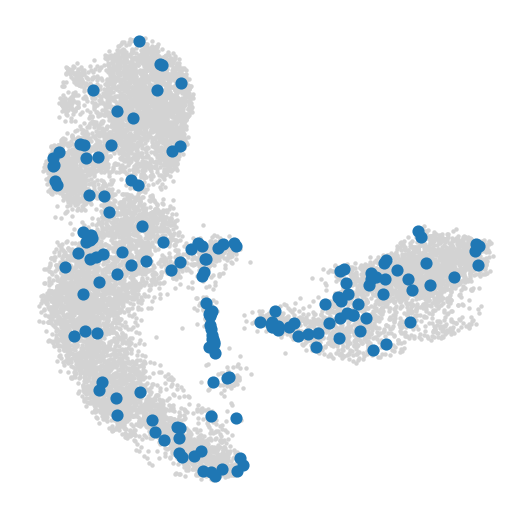

Randomly initialized A matrix.
Setting convergence threshold at 0.00221
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Converged after 30 iterations.


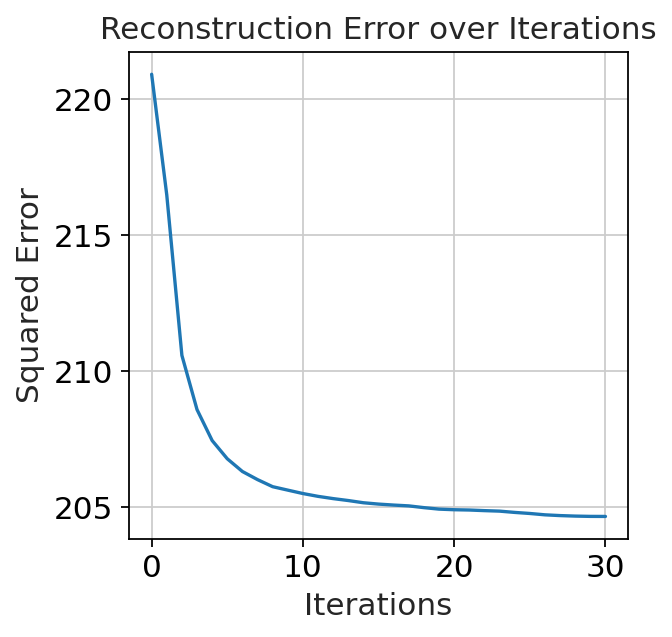

100%|██████████| 158/158 [00:02<00:00, 56.87it/s]
/env/lib/python3.10/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


30-40: 13790 cells → 184 metacells (~75 cells each)
Welcome to SEACells GPU!
Computing kNN graph using scanpy NN ...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
Computing radius for adaptive bandwidth kernel...


  0%|          | 0/13790 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


  0%|          | 0/13790 [00:00<?, ?it/s]

Building similarity LIL matrix...


  0%|          | 0/13790 [00:00<?, ?it/s]

Constructing CSR matrix...
Building kernel on X_pca_harmony
Computing diffusion components from X_pca_harmony for waypoint initialization ... 
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
Done.
Sampling waypoints ...
Done.
Selecting 169 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|██████████| 25/25 [00:00<00:00, 25.73it/s]


Selecting 15 cells from greedy initialization.


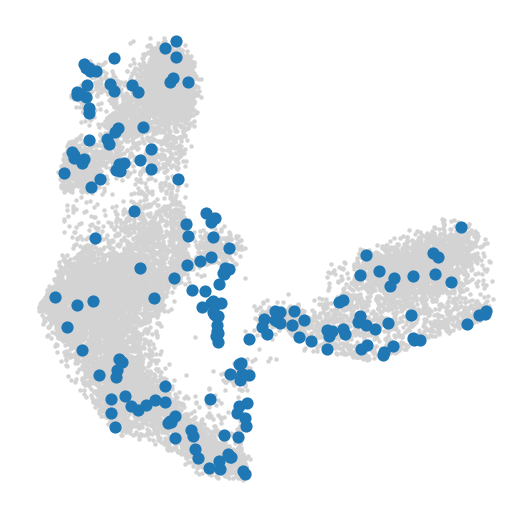

Randomly initialized A matrix.
Setting convergence threshold at 0.00237
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Converged after 39 iterations.


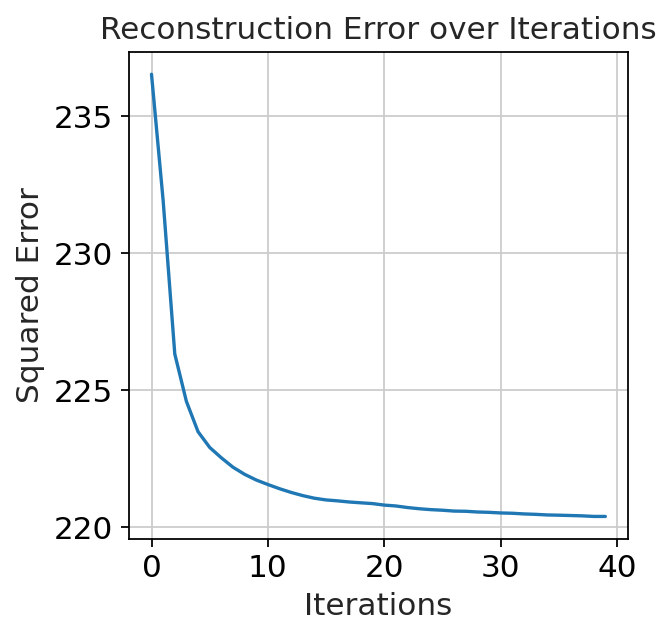

100%|██████████| 184/184 [00:03<00:00, 54.91it/s]
/env/lib/python3.10/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


40-50: 11380 cells → 152 metacells (~75 cells each)
Welcome to SEACells GPU!
Computing kNN graph using scanpy NN ...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
Computing radius for adaptive bandwidth kernel...


  0%|          | 0/11380 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


  0%|          | 0/11380 [00:00<?, ?it/s]

Building similarity LIL matrix...


  0%|          | 0/11380 [00:00<?, ?it/s]

Constructing CSR matrix...
Building kernel on X_pca_harmony
Computing diffusion components from X_pca_harmony for waypoint initialization ... 
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
Done.
Sampling waypoints ...
Done.
Selecting 133 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|██████████| 29/29 [00:00<00:00, 54.37it/s]

Selecting 19 cells from greedy initialization.


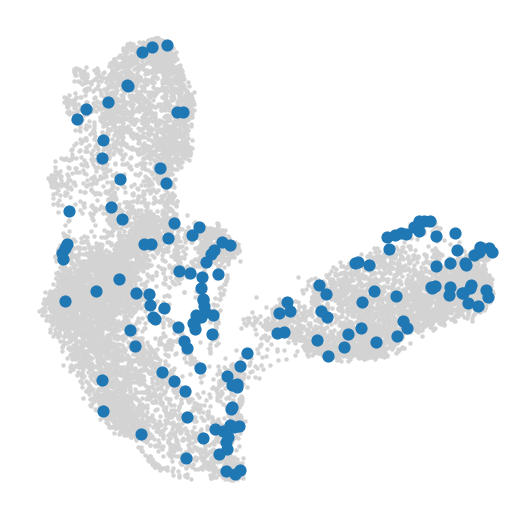

Randomly initialized A matrix.
Setting convergence threshold at 0.00217
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Converged after 28 iterations.


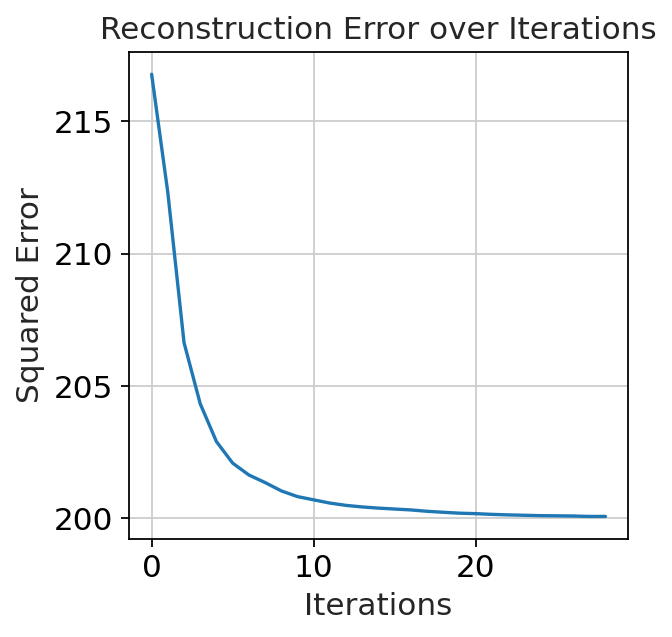

100%|██████████| 152/152 [00:02<00:00, 55.94it/s]
/env/lib/python3.10/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [20]:
SEA_adata = []
adata_seacells = []

build_kernel_on = 'X_pca_harmony'
n_waypoint_eigs = 10

adata.obsm['X_umap'] = adata.obsm['X_umap_harmony'].copy()

for age_group in adata.obs["age_group"].unique():
    sub = adata[adata.obs["age_group"] == age_group].copy()
    n_cells = sub.n_obs
    n_SEACells = max(1, round(n_cells / 75))  # at least 1 metacell

    print(f"{age_group}: {n_cells} cells → {n_SEACells} metacells (~75 cells each)")

    model = SEACells.core.SEACells(
        sub,
        build_kernel_on=build_kernel_on,
        n_SEACells=n_SEACells,
        n_waypoint_eigs=n_waypoint_eigs,
        convergence_epsilon=1e-5,
        use_gpu=True
    )
    model.construct_kernel_matrix(n_neighbors=20)
    model.initialize_archetypes()
    
    SEACells.plot.plot_initialization(sub, model)

    model.fit(min_iter=10, max_iter=100)
    model.plot_convergence()
    #sub.obs[['SEACell']].to_csv(output_path + age_group + '_seacell_assignments.csv')        

    SEA_sub = SEACells.core.summarize_by_SEACell(
        sub,
        SEACells_label="SEACell",
        summarize_layer="counts",
        celltype_label="cell_type"
    )
    SEA_sub.obs["age_group"] = age_group
    SEA_adata.append(SEA_sub)
    adata_seacells.append(sub)

In [21]:
SEA_adata

[AnnData object with n_obs × n_vars = 158 × 35725
     obs: 'cell_type', 'cell_type_purity', 'age_group'
     layers: 'raw',
 AnnData object with n_obs × n_vars = 184 × 35725
     obs: 'cell_type', 'cell_type_purity', 'age_group'
     layers: 'raw',
 AnnData object with n_obs × n_vars = 152 × 35725
     obs: 'cell_type', 'cell_type_purity', 'age_group'
     layers: 'raw']

In [22]:
adata_seacells

[AnnData object with n_obs × n_vars = 11841 × 35725
     obs: 'assay_differentiation', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_type_original', 'gm', 'id', 'individual', 'state_exact', 'suspension_type', 'tech_sample', 'treatment', 'organoid_age_days', 'publication', 'doi', 'batch', 'annot_level_1', 'annot_level_2', 'annot_level_3_rev2', 'annot_level_4_rev2', 'annot_region_rev2', 'annot_ntt_rev2', 'Hallmark_Glycolysis', 'hnoca_core', 'annot_level_2_extended', 'tissue_type', 'sex_ontology_term_id', 'donor_id', 'assay_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'disease_ontology_term_id', 'development_stage_ontology_term_id', 'cell_type_ontology_term_id', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'age_group', 'SEACell'
     var: 'gene_length', 'highly_variable', 'highly_variable_rank', 'highly_variable_nbatches', 'feature_is_

In [66]:
# Merge into one AnnData
SEA_adata_final = SEA_adata[0].concatenate(
    *SEA_adata[1:],
    batch_key="age_group",
    batch_categories=adata.obs["age_group"].unique().tolist()
)   

/tmp/ipykernel_17509/79362249.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  SEA_adata_final = SEA_adata[0].concatenate(


In [67]:
SEA_adata_final

AnnData object with n_obs × n_vars = 494 × 35725
    obs: 'cell_type', 'cell_type_purity', 'age_group'
    layers: 'raw'

In [68]:
# Merge into one AnnData
adata_seacells_final = adata_seacells[0].concatenate(
    *adata_seacells[1:],
    batch_key="age_group",
    batch_categories=adata.obs["age_group"].unique().tolist()
)   

/tmp/ipykernel_17509/3717995399.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_seacells_final = adata_seacells[0].concatenate(


In [69]:
adata_seacells_final

AnnData object with n_obs × n_vars = 37011 × 35725
    obs: 'assay_differentiation', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_type_original', 'gm', 'id', 'individual', 'state_exact', 'suspension_type', 'tech_sample', 'treatment', 'organoid_age_days', 'publication', 'doi', 'batch', 'annot_level_1', 'annot_level_2', 'annot_level_3_rev2', 'annot_level_4_rev2', 'annot_region_rev2', 'annot_ntt_rev2', 'Hallmark_Glycolysis', 'hnoca_core', 'annot_level_2_extended', 'tissue_type', 'sex_ontology_term_id', 'donor_id', 'assay_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'disease_ontology_term_id', 'development_stage_ontology_term_id', 'cell_type_ontology_term_id', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'age_group', 'SEACell'
    var: 'gene_length', 'highly_variable', 'highly_variable_rank', 'highly_variable_nbatches', 'feature_is_fil

## 5. Summarizing data

* The original dataset can be summarized by SEACell by aggregating cells within each SEACell, summing over all raw data for all cells belonging to a SEACell.  
* The output of this function is an anndata object of shape n_metacells x original_data_dimension.
* Data is unnormalized and raw aggregated counts are stored in X.
* Attributes associated with variables (.var) are copied over, but relevant per SEACell attributes must be manually copied, since certain attributes may need to be summed, or averaged etc, depending on the attribute.

### 5.1 Summarize by hard assignment

In [70]:
SEA_adata_final.obs.head()

,cell_type,cell_type_purity,age_group
SEACell-57-<30,radial glial cell,0.844660,<30
SEACell-123-<30,radial glial cell,0.715686,<30
SEACell-71-<30,radial glial cell,0.932961,<30
SEACell-111-<30,radial glial cell,0.725000,<30
SEACell-75-<30,radial glial cell,0.748503,<30


In [71]:
adata_seacells_final.obs[["SEACell"]].duplicated().value_counts()

True     36827
False      184
Name: count, dtype: int64

In [72]:
adata_seacells_final.obs

,assay_differentiation,assay_type_differentiation,bio_sample,cell_line,cell_type_original,gm,id,individual,state_exact,suspension_type,...,cell_type,assay,disease,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid,age_group,SEACell
index,,,,,,,,,,,,,,,,,,,,,
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_252_H28126SWeek3_AGTTGGTAGTTAGGTA-<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",guided,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,custom_H28126,Radial Glia_Pan-radial glia,unknown,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,unknown,unknown,cell,...,radial glial cell,10x 3' v2,normal,male,telencephalon,unknown,unknown,YMB%E`~wbU,<30,SEACell-57
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_272_H28126SWeek3_GATCGTATCTTGCATT-<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",guided,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,custom_H28126,Radial Glia_Pan-radial glia,unknown,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,unknown,unknown,cell,...,radial glial cell,10x 3' v2,normal,male,telencephalon,unknown,unknown,OuFAwkoUVo,<30,SEACell-123
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_406_H28126SWeek3_CTCTACGTCTACCAGA-<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",guided,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,custom_H28126,Radial Glia_Pan-radial glia,unknown,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,unknown,unknown,cell,...,radial glial cell,10x 3' v2,normal,male,telencephalon,unknown,unknown,oPqY~ZV}=Q,<30,SEACell-71
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_723_H28126SWeek3_CTAGCCTGTGAGTGAC-<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",guided,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,custom_H28126,Radial Glia_Pan-radial glia,unknown,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,unknown,unknown,cell,...,radial glial cell,10x 3' v2,normal,male,telencephalon,unknown,unknown,qhYd<<I45@,<30,SEACell-111
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_2287_H28126SWeek3_GCGGGTTCAACTGCGC-<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",guided,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,custom_H28126,Radial Glia_Hindbrain RG,unknown,homosapiens_None_2020_10x3v2_bhaduriaparna_001...,unknown,unknown,cell,...,radial glial cell,10x 3' v2,normal,male,telencephalon,unknown,unknown,M78cjtLDjj,<30,SEACell-75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
homosapiens_telencephalon_2022_10x3v3_uzquianoana_003_d10_1016_j_cell_2022_09_010_38544_3_TTTGACTGTTCGGCTG-1_2_1.5m-40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",guided,homosapiens_telencephalon_2022_10x3v3_uzquiano...,GM23338,aRG,unknown,homosapiens_telencephalon_2022_10x3v3_uzquiano...,homosapiens_telencephalon_2022_10x3v3_uzquiano...,unknown,cell,...,radial glial cell,10x 3' v3,normal,male,telencephalon,unknown,55-year-old stage,HM0P7-y3sF,40-50,SEACell-11
homosapiens_telencephalon_2022_10x3v3_uzquianoana_003_d10_1016_j_cell_2022_09_010_38553_3_TTTGGAGCAACTGCCG-1_2_1.5m-40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",guided,homosapiens_telencephalon_2022_10x3v3_uzquiano...,GM23338,aRG,unknown,homosapiens_telencephalon_2022_10x3v3_uzquiano...,homosapiens_telencephalon_2022_10x3v3_uzquiano...,unknown,cell,...,radial glial cell,10x 3' v3,normal,male,telencephalon,unknown,55-year-old stage,f;rXUL~=4N,40-50,SEACell-14
homosapiens_telencephalon_2022_10x3v3_uzquianoana_003_d10_1016_j_cell_2022_09_010_38558_3_TTTGGTTAGGTACATA-1_2_1.5m-40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",guided,homosapiens_telencephalon_2022_10x3v3_uzquiano...,GM23338,Immature DL PN,unknown,homosapiens_telencephalon_2022_10x3v3_uzquiano...,homosapiens_telencephalon_2022_10x3v3_uzquiano...,unknown,cell,...,pyramidal neuron,10x 3' v3,normal,male,telencephalon,unknown,55-year-old stage,o|ZS<eyOkU,40-50,SEACell-145


In [73]:
adata_seacells_final.obs['SEACell'] = (
    adata_seacells_final.obs['SEACell'].astype(str) + "-" +
    adata_seacells_final.obs['age_group'].astype(str)
)

adata_seacells_final.obs['SEACell'].head()

index
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_252_H28126SWeek3_AGTTGGTAGTTAGGTA-<30      SEACell-57-<30
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_272_H28126SWeek3_GATCGTATCTTGCATT-<30     SEACell-123-<30
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_406_H28126SWeek3_CTCTACGTCTACCAGA-<30      SEACell-71-<30
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_723_H28126SWeek3_CTAGCCTGTGAGTGAC-<30     SEACell-111-<30
homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0_2287_H28126SWeek3_GCGGGTTCAACTGCGC-<30     SEACell-75-<30
Name: SEACell, dtype: object

## 6. Summarize metadata (for hard assignment)

* Metadata that is available at the cell level can be summarized as an annotation at the metacell level
* Countinous variables are averaged across the cells assigned to each metacell
* Categorical variables are determined by the most prevalent category amongst the cells assigned to the metacell

In [74]:
top_assay_differentiation = adata_seacells_final.obs['assay_differentiation'].groupby(adata_seacells_final.obs['SEACell']).value_counts().groupby(level=0, group_keys=False).head(1) 
SEA_adata_final.obs['agg_assay_differentiation'] = top_assay_differentiation[SEA_adata_final.obs_names].index.get_level_values(1)

top_batch = adata_seacells_final.obs['batch'].groupby(adata_seacells_final.obs['SEACell']).value_counts().groupby(level=0, group_keys=False).head(1)
SEA_adata_final.obs['Aggregated_batch'] = top_batch[SEA_adata_final.obs_names].index.get_level_values(1)

SEA_adata_final.obs.head()

,cell_type,cell_type_purity,age_group,agg_assay_differentiation,Aggregated_batch
SEACell-57-<30,radial glial cell,0.844660,<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...
SEACell-123-<30,radial glial cell,0.715686,<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
SEACell-71-<30,radial glial cell,0.932961,<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
SEACell-111-<30,radial glial cell,0.725000,<30,"Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0)...",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
SEACell-75-<30,radial glial cell,0.748503,<30,"Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0)...",homosapiens_None_2020_10x3v2_bhaduriaparna_001...


In [75]:
SEA_adata_final.obs

,cell_type,cell_type_purity,age_group,agg_assay_differentiation,Aggregated_batch
SEACell-57-<30,radial glial cell,0.844660,<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...
SEACell-123-<30,radial glial cell,0.715686,<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
SEACell-71-<30,radial glial cell,0.932961,<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
SEACell-111-<30,radial glial cell,0.725000,<30,"Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0)...",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
SEACell-75-<30,radial glial cell,0.748503,<30,"Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0)...",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
...,...,...,...,...,...
SEACell-16-40-50,extratelencephalic-projecting glutamatergic co...,0.972222,40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...
SEACell-134-40-50,radial glial cell,1.000000,40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...
SEACell-20-40-50,unknown,0.916667,40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...
SEACell-40-40-50,extratelencephalic-projecting glutamatergic co...,0.958333,40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...


## 7. Visualize results

* __plot_2D()__:  visualize metacell assignments on UMAP or any 2-dimensional embedding froma adata.obsm. Plots can also be coloured by metacell assignment. The visualization allows to assess the __representativeness__ of the calculated metacells: ability to represent the global structure of the original dataset. Better representation corresponds to a more uniform coverage of the dataset.

* __plot_SEACell_sizes()__: distribution of number of cells assigned to each metacell. Given to the non-uniform distribution of cell type density, metacells are expected to vary in size: larger metacells are retrieved from denser regions, and smaller metacells from sparser ones. However outlier values may require further inspection. 



/env/lib/python3.10/site-packages/SEACells/plot.py:63: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mcs = umap.groupby("SEACell").mean().reset_index()
/env/lib/python3.10/site-packages/seaborn/relational.py:438: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  points = ax.scatter(x=x, y=y, **kws)
/env/lib/python3.10/site-packages/seaborn/relational.py:438: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


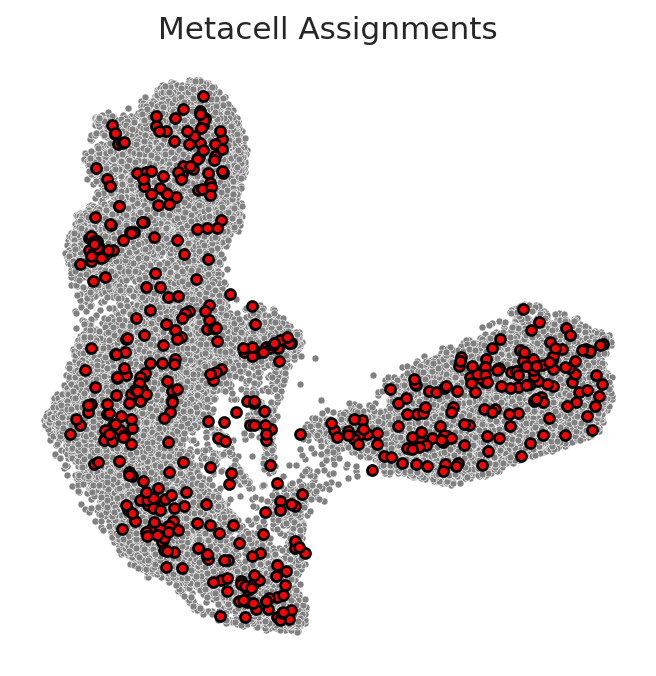

In [76]:
SEACells.plot.plot_2D(adata_seacells_final, key='X_umap', colour_metacells=False)

/env/lib/python3.10/site-packages/SEACells/plot.py:63: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mcs = umap.groupby("SEACell").mean().reset_index()
/env/lib/python3.10/site-packages/seaborn/relational.py:438: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  points = ax.scatter(x=x, y=y, **kws)
/env/lib/python3.10/site-packages/seaborn/relational.py:438: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


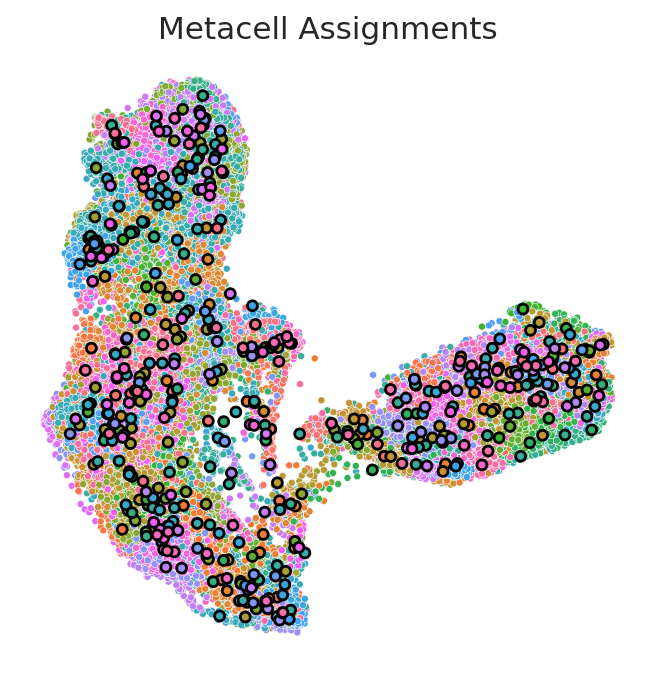

In [77]:
SEACells.plot.plot_2D(adata_seacells_final, key='X_umap', colour_metacells=True)

/env/lib/python3.10/site-packages/SEACells/plot.py:130: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(label_df.groupby("SEACell").count().iloc[:, 0], bins=bins)


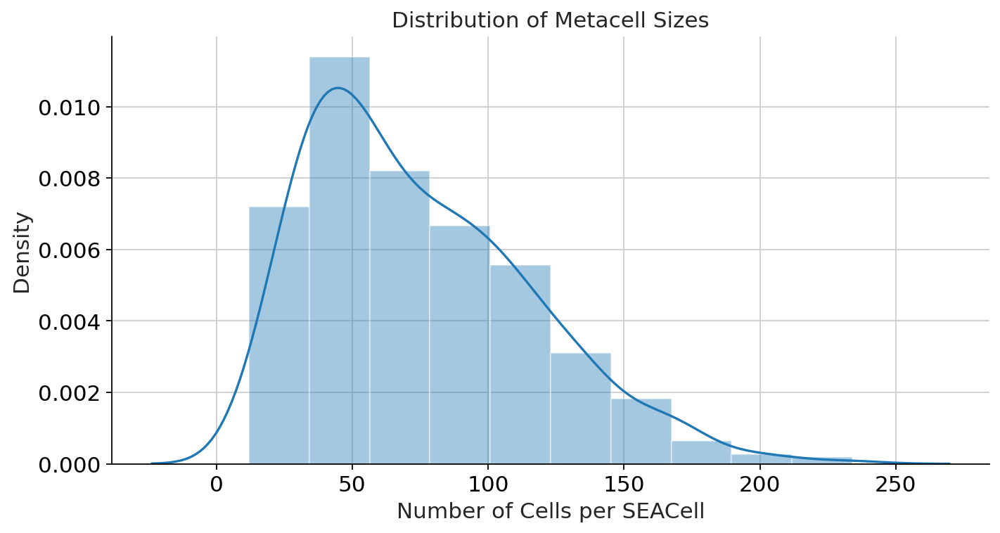

,size
SEACell,
SEACell-0-30-40,113
SEACell-0-40-50,234
SEACell-0-<30,60
SEACell-1-30-40,40
SEACell-1-40-50,88
...,...
SEACell-98-40-50,59
SEACell-98-<30,92
SEACell-99-30-40,117


In [78]:
SEACells.plot.plot_SEACell_sizes(adata_seacells_final, bins=10, figsize=(10, 5))

## 8. Quantifying results

* __Purity__: compute_celltype_purity(ad, col_name) computes the purity of different celltype labels within a SEACell metacell. 
  
* __Compactness__: per-SEAcell variance in diffusion components (typically 'X_pca' for RNA). Lower values of compactness suggest more compact/lower variance metacells.

* __Separation__: distance between a SEACell and its nth_nbr. If cluster is provided as a string, e.g. 'celltype', nearest neighbors are restricted to have the same celltype value. Higher values of separation suggest better distinction between metacells. 

### 8.1 Purity

#### Cell Population

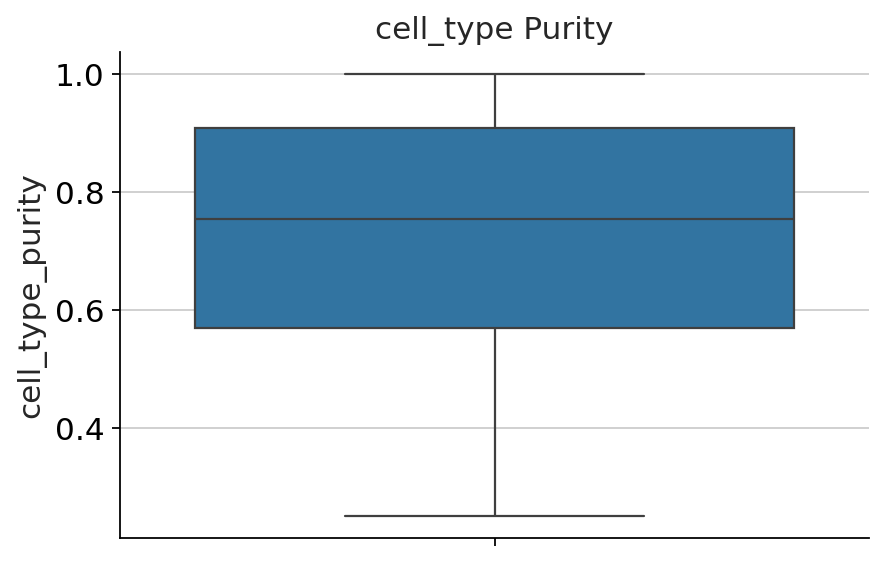

,cell_type,cell_type_purity
SEACell,,
SEACell-0-30-40,radial glial cell,0.451327
SEACell-0-40-50,radial glial cell,0.585470
SEACell-0-<30,radial glial cell,0.700000
SEACell-1-30-40,neuroblast (sensu Vertebrata),0.275000
SEACell-1-40-50,fibroblast of choroid plexus,0.965909


In [79]:
SEACell_purity = SEACells.evaluate.compute_celltype_purity(adata_seacells_final, 'cell_type')

plt.figure(figsize=(6,4))
sns.boxplot(data=SEACell_purity, y='cell_type_purity')
plt.title('cell_type Purity')
sns.despine()
plt.show()
plt.close()

SEACell_purity.head()

### 8.2 Compactness

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)


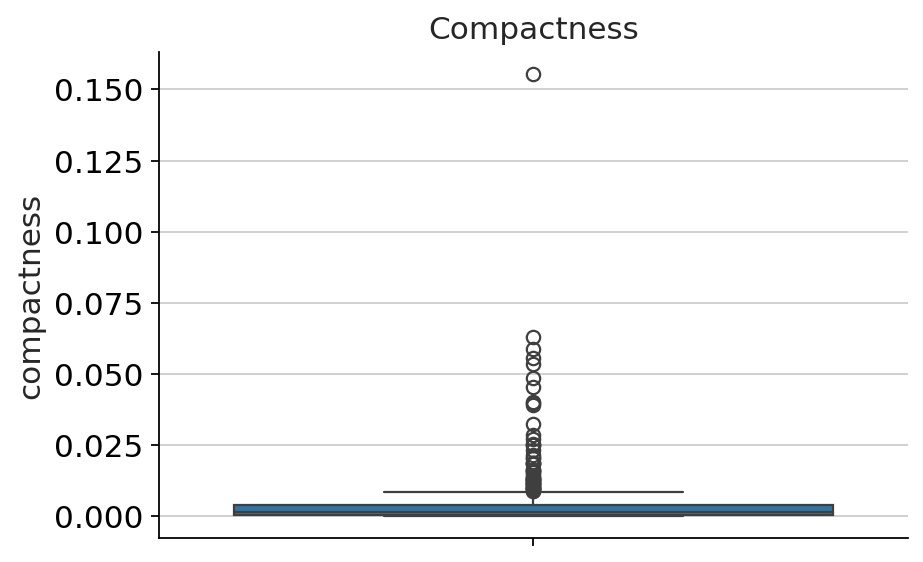

,compactness
SEACell,
SEACell-0-30-40,0.000760
SEACell-0-40-50,0.000669
SEACell-0-<30,0.001766
SEACell-1-30-40,0.003863
SEACell-1-40-50,0.002728


In [80]:
compactness = SEACells.evaluate.compactness(adata_seacells_final, 'X_pca_harmony')

plt.figure(figsize=(6,4))
sns.boxplot(data=compactness, y='compactness')
plt.title('Compactness')
sns.despine()
plt.show()
plt.close()

compactness.head()

### 8.3 Separation

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)


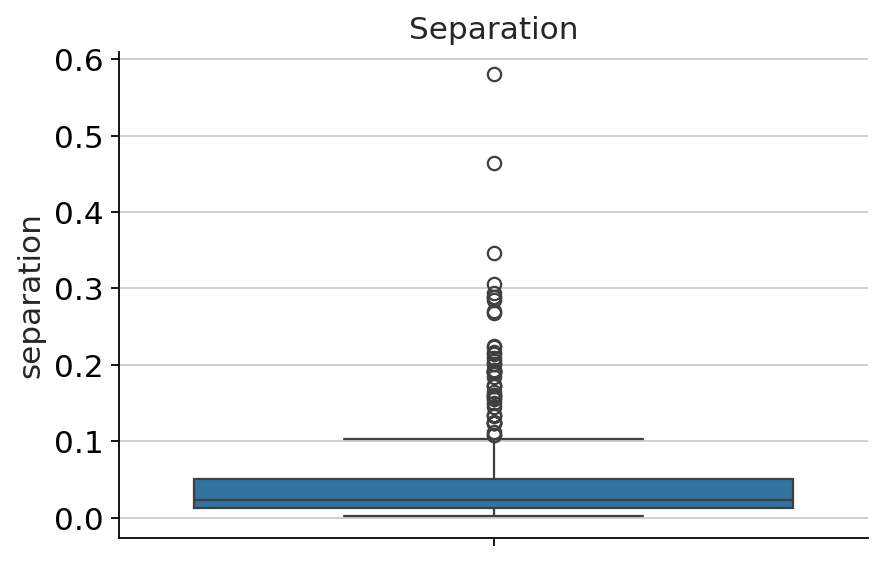

,separation
SEACell,
SEACell-0-30-40,0.020879
SEACell-0-40-50,0.019870
SEACell-0-<30,0.034541
SEACell-1-30-40,0.024948
SEACell-1-40-50,0.039326


In [81]:
separation = SEACells.evaluate.separation(adata_seacells_final, 'X_pca_harmony')

plt.figure(figsize=(6,4))
sns.boxplot(data=separation, y='separation')
plt.title('Separation')
sns.despine()
plt.show()
plt.close()

separation.head()

## 9. Hard assignment: downstream processing

* normalization and log-transformation
* dimensionality reduction: PCA and UMAP on SEACells

In [85]:
SEA_adata_final.layers['counts'] = SEA_adata_final.X.copy()

sc.pp.normalize_total(SEA_adata_final)
sc.pp.log1p(SEA_adata_final)
SEA_adata_final.layers['lognorm'] = SEA_adata_final.X.copy()

normalizing counts per cell
    finished (0:00:00)


In [86]:
SEA_adata_final.obs

,cell_type,cell_type_purity,age_group,agg_assay_differentiation,Aggregated_batch
SEACell-57-<30,radial glial cell,0.844660,<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...
SEACell-123-<30,radial glial cell,0.715686,<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
SEACell-71-<30,radial glial cell,0.932961,<30,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
SEACell-111-<30,radial glial cell,0.725000,<30,"Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0)...",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
SEACell-75-<30,radial glial cell,0.748503,<30,"Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0)...",homosapiens_None_2020_10x3v2_bhaduriaparna_001...
...,...,...,...,...,...
SEACell-16-40-50,extratelencephalic-projecting glutamatergic co...,0.972222,40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...
SEACell-134-40-50,radial glial cell,1.000000,40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...
SEACell-20-40-50,unknown,0.916667,40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...
SEACell-40-40-50,extratelencephalic-projecting glutamatergic co...,0.958333,40-50,"Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",homosapiens_telencephalon_2022_10x3v3_uzquiano...


In [87]:
sc.pp.highly_variable_genes(SEA_adata_final, inplace=True, batch_key="agg_assay_differentiation")
sc.tl.pca(SEA_adata_final, use_highly_variable=True)
sc.pp.neighbors(SEA_adata_final, use_rep='X_pca')
sc.tl.umap(SEA_adata_final)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    with n_comps=50


/env/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:385: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


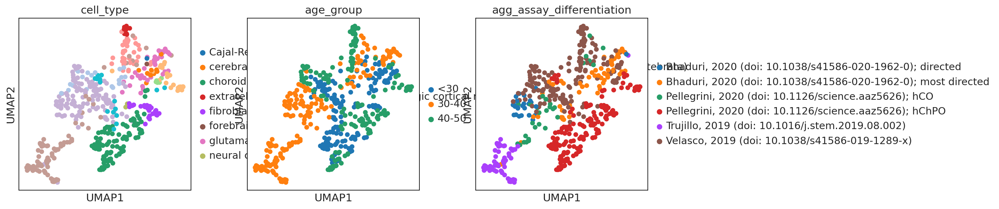

In [88]:
sc.pl.umap(SEA_adata_final, color=['cell_type', 'age_group', 'agg_assay_differentiation'], s=150)

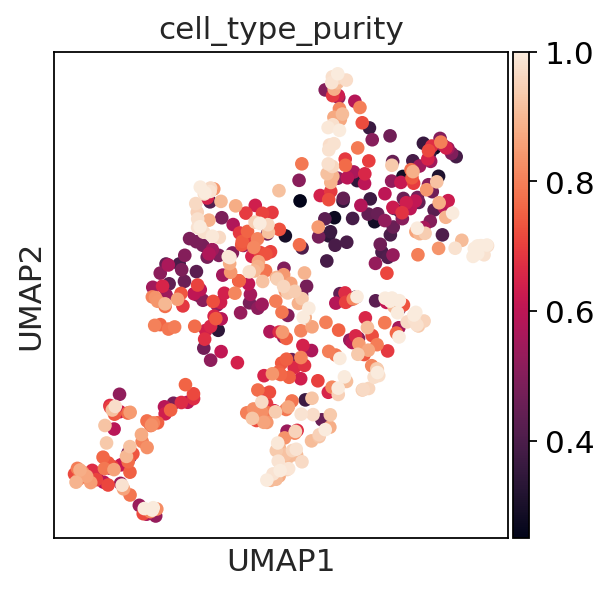

In [89]:
sc.pl.umap(SEA_adata_final, color=['cell_type_purity'], s=150)

In [90]:
SEA_adata_final.obs.columns

Index(['cell_type', 'cell_type_purity', 'age_group',
       'agg_assay_differentiation', 'Aggregated_batch'],
      dtype='object')

## 10 Visualization of receptor gene expressions

Loading of hormonal receptor gene signature.

In [91]:
signatures = '../../../../DataDir/ExternalData/Receptors/EndocrineKeyGenes.txt'

In [92]:
sig = pd.read_csv(signatures, sep="\t", keep_default_na=False)  
print(sig.shape)
sig

(30, 2)


,GeneName,Signature
0,THRB,THY
1,THRA,THY
2,THRAP3,THY
3,DIO1,THY
4,DIO2,THY
5,DIO3,THY
6,SLC16A10,THY
7,SLC16A2,THY
8,SLC7A5,THY
9,KLF9,THY


In [93]:
genes = sig["GeneName"].values.tolist()

In [94]:
SEA_adata_final.var

,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
ENSG00000000003,False,3.505966,1.705760,0.060886,0,False
ENSG00000000005,False,0.226018,0.566248,0.362123,2,False
ENSG00000000419,False,2.914885,0.678085,-0.785976,0,False
ENSG00000000457,False,1.163756,0.371380,-0.726134,0,False
ENSG00000000460,False,1.296283,1.034302,0.224058,1,False
...,...,...,...,...,...,...
ENSG00000288721,False,0.000000,0.000000,0.000000,0,False
ENSG00000288722,False,1.289671,0.469089,-0.444192,1,False
ENSG00000288723,False,0.000000,0.000000,0.000000,0,False
ENSG00000288724,False,0.000000,0.000000,0.000000,0,False


In [95]:
SEA_adata_final.var["feature_name"] = SEA_adata_final.var.index.map(adata.var["feature_name"])

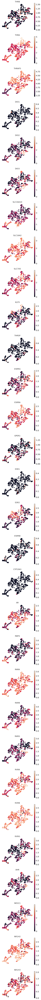

In [96]:
fn.CustomUmap(SEA_adata_final, genes, embedding="X_umap", var_col = "feature_name", gene_symbols="feature_name", s=150) 

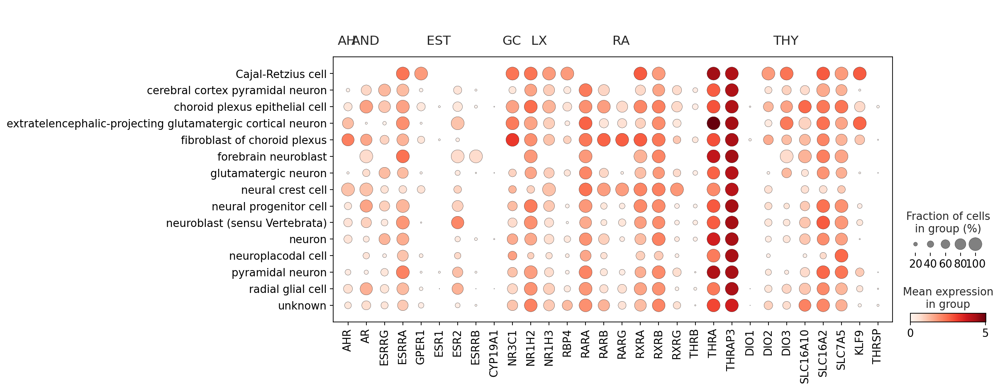

In [97]:
outdir = "../../../../FigPaper/"

os.makedirs(outdir, exist_ok=True)

sc.settings.figdir = outdir

gene_dict = sig.groupby("Signature")["GeneName"].apply(list).to_dict()

gene_dict_filtered = {
    sig_name: [g for g in genes if g in SEA_adata_final.var['feature_name'].values]
    for sig_name, genes in gene_dict.items()
}

gene_dict_filtered = {k: v for k, v in gene_dict_filtered.items() if v}

if gene_dict_filtered:
    sc.pl.dotplot(
        SEA_adata_final,
        gene_dict_filtered,
        groupby='cell_type',
        gene_symbols='feature_name',
        save="dotplot_HNOCA.png"
    )
else:
    print("None of the specified genes are found.")

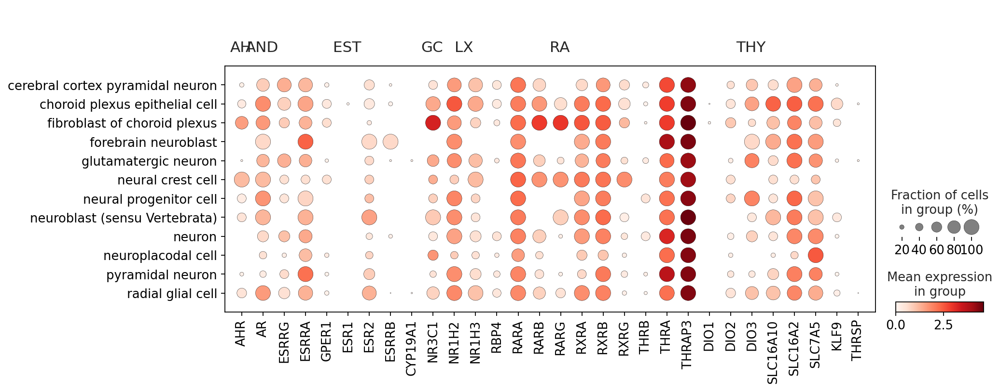

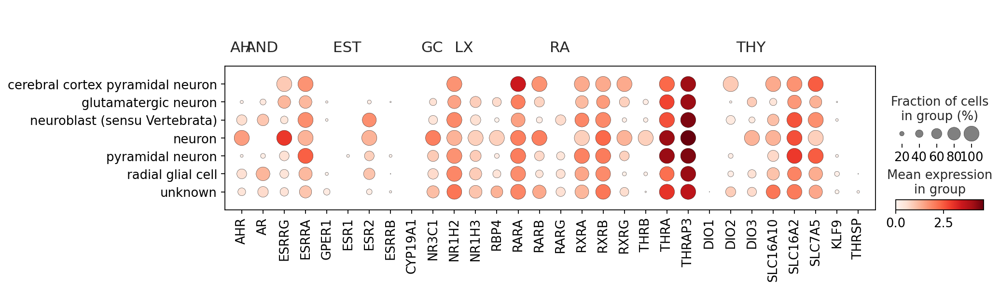

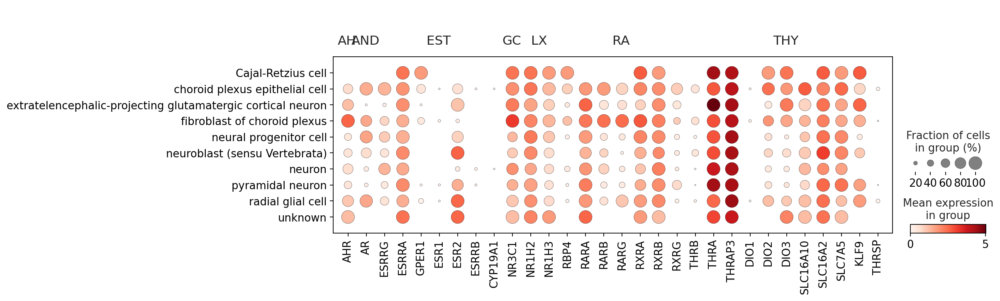

In [100]:
import os
import scanpy as sc

outdir = "../../../../FigPaper/"
os.makedirs(outdir, exist_ok=True)
sc.settings.figdir = outdir

gene_dict = sig.groupby("Signature")["GeneName"].apply(list).to_dict()

gene_dict_filtered = {
    sig_name: [g for g in genes if g in SEA_adata_final.var['feature_name'].values]
    for sig_name, genes in gene_dict.items()
}
gene_dict_filtered = {k: v for k, v in gene_dict_filtered.items() if v}

if gene_dict_filtered:
    for age_group in ['<30', '30-40', '40-50']:
        ad_sub = SEA_adata_final[SEA_adata_final.obs['age_group'] == age_group].copy()

        if ad_sub.n_obs == 0:
            print(f"No cells for age group {age_group}, skipping.")
            continue

        safe_age = age_group.replace("<", "lt").replace("-", "_")
        
        sc.pl.dotplot(
            ad_sub,
            gene_dict_filtered,
            groupby='cell_type',
            gene_symbols='feature_name',
            save=f"dotplot_HNOCA_{safe_age}.png"
        )
else:
    print("None of the specified genes are found.")

----------------

# 11. Saving

## 11.1 Save SEACell Adata

In [101]:
SEA_adata_final

AnnData object with n_obs × n_vars = 494 × 35725
    obs: 'cell_type', 'cell_type_purity', 'age_group', 'agg_assay_differentiation', 'Aggregated_batch'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'feature_name'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'cell_type_colors', 'age_group_colors', 'agg_assay_differentiation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw', 'counts', 'lognorm'
    obsp: 'distances', 'connectivities'

In [102]:
SEA_adata_final.X

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 5749117 stored elements and shape (494, 35725)>

In [103]:
output_file

'../../../../DataDir/ExternalData/SingleCellData/HNOCA_protocol_age_Metacells_harmony.h5ad'

In [104]:
SEA_adata_final.write(output_file)

## 11.2 Save in other formats

In [105]:
%%bash

# save also html and python versions for git
jupyter nbconvert "3.2SEACellsHNOCA_age_MetaCellGen.ipynb" --to="python" --output="3.2SEACellsHNOCA_age_MetaCellGen"
jupyter nbconvert "3.2SEACellsHNOCA_age_MetaCellGen.ipynb" --to="html" --output="3.2SEACellsHNOCA_age_MetaCellGen"

[NbConvertApp] Converting notebook 3.2SEACellsHNOCA_age_MetaCellGen.ipynb to python
[NbConvertApp] Writing 15243 bytes to 3.2SEACellsHNOCA_age_MetaCellGen.py
[NbConvertApp] Converting notebook 3.2SEACellsHNOCA_age_MetaCellGen.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 23 image(s).
[NbConvertApp] Writing 14171375 bytes to 3.2SEACellsHNOCA_age_MetaCellGen.html


## 11.3 Finished computations: timestamp

In [106]:
print(datetime.now())

2026-04-16 15:17:07.463346
